##  Imprinting analysis in early maize embryo

In [1]:
from IPython import display

In [6]:
import pandas as pd

## Analysis

### 1. Samples introduction

We collected the maize embryo of 5DAP, 7DAP, 9DAP, 11DAP, 13DAP by manual pick ,3DAP and 5DAP by LCM in BM and MB, each sample has three biological replicates

### 2.Check quality of clean reads

`qsub $BIN/FASTQC.bash`


Example: FastQC result of [BM_05_1](./notebook_material/BM_05_1_R1.clean.fq_fastqc/fastqc_report.html)

### 3. Mapping reads to reference genome, calculating gene expression level (raw counts , FPKM ) and allelic expression(raw counts)

####  Analysis pipeline

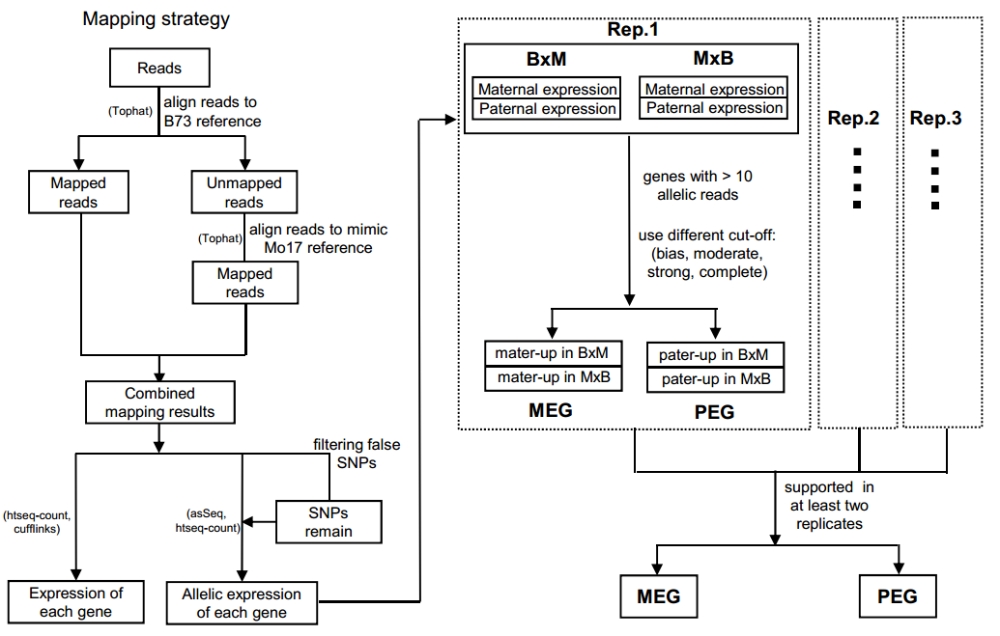

In [2]:
display.Image("notebook_material/Imp_analysis.png")

**Method:**

+ Clean reads were first aligned to the B73 reference genome using the Tophat aligner and the unmapped reads were remapped to the Mo17 reference genome. After combining above mapping results, gene expression likes read counts and FPKM were summarized by HTSeq-count and Cufflinks software. To get allelic expression of each genes, we firstly removed false SNPs. For false SNPs, reads tend to be mapped to only one parental allele in all samples. We kept positive SNPS supported by at least 1% of the reads in each pair of reciprocal hybrids. After this, according to remain SNPs, asSeq was used to extract allele-specific reads from the mapping results and HTSeq-count was used to summarize the allele-specific reads of each genes in every samples. 
  
+ For each replicate of reciprocal hybrids, we did the following analysis. Genes which had more than 10 allelic reads for each direction of the cross were used to perform the chi-square (χ2) test. Under different cut-off, we found the maternally expressed genes and paternally expressed genes in both direction of the cross. Genes that were identified as final imprinted genes were supported by at least two replicates.

**Script**:

`
qsub $BIN/tophat_htseq_part1.bash
qsub $BIN/tophat_htseq_part2.bash
qsub $BIN/call_depth.bash
bash $BIN/call_depth_step2.bash
bsh $BIN/ASE_expression_stat.bash
bash $BIN/ASE/ASE_analysis.bash
bash $BIN/ASE/ASE_sample_join_new.bash
`




In [2]:
import pandas as pd

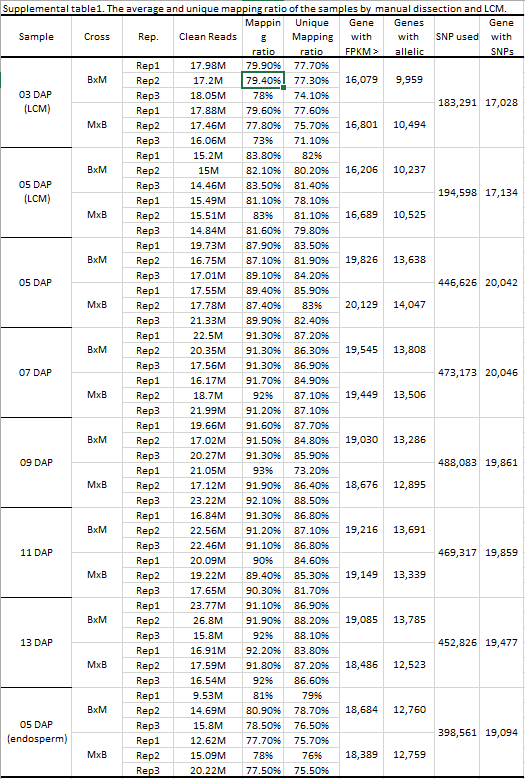

In [4]:
display.Image("notebook_material/IMP_reads_summary.png")

Mapping result:

Propotion of B73 and Mo17 allelic reads from mapping results

In [3]:
ASE=pd.read_table('notebook_material/ASE.stat',header=0,index_col=0,sep="\t")

### 4.PCA and correlation analysis

`
Rscript $SRC/edgeR_pheat_MDS_cluster.R
Rscript $SRC/Samples_pheat_MDS_cluster.R  ## useing log2(FPKM+1) to calculate spearman's correlation  
`


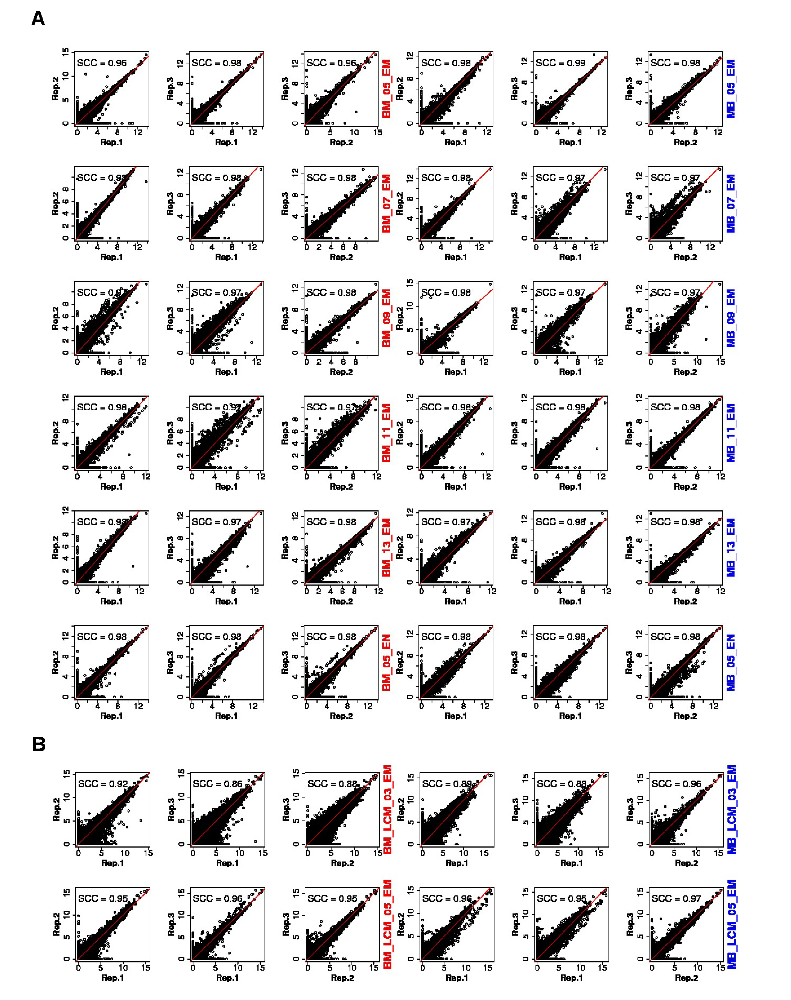

In [13]:
display.Image("notebook_material/Fig.S1.jpg",width=700,height=700)

**legend** 
Supplemental Figure 1. Correlation between gene expression in biological
replicates.The normalized gene expression of log2 (FPKM value + 1) was used to calculate the correlation coefficient between biological replicates. SCC: spearman correlation coefficient.(A) Correlation between biological replicates from 5, 7, 9, 11, and 13 DAP embryos and 5 DAP endosperms isolated by manual dissection.(B)Correlation between biological replicates from 3 DAP and 5 DAP embryos by LCM.
**Good correlation of replicates.**

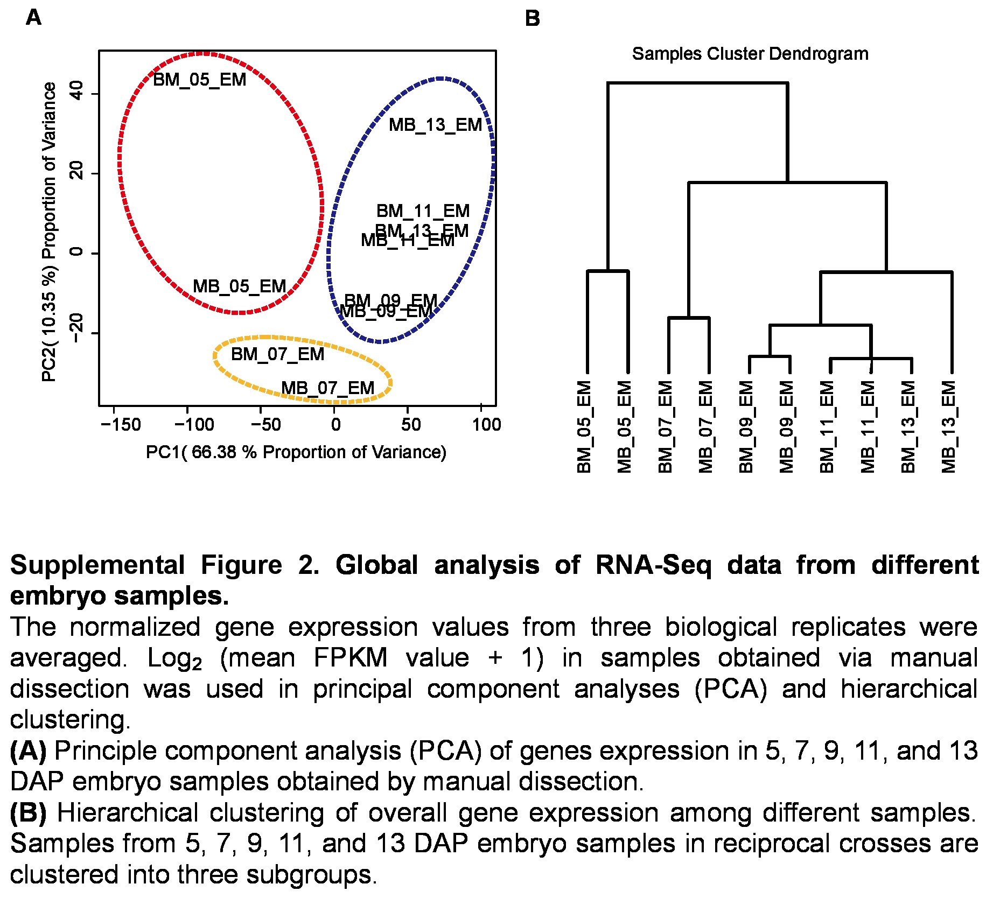

In [14]:
display.Image("notebook_material/PP2017-RA-supp-2.jpg",width=500,height=500)

###  Differential expressed genes analysis(DEGs)

code

`bash $BIN/DEG.bash #IMP`

`Rscript $SRC/edgeR.R ### for barplot`

`Rscript $SRC/DEG_number_plot.R`


`Rscript $SRC/edgeR_cluster_k10.R ## for picked clusters`

`Rscript $SRC/DEG_gene_ov.R  ## Overlap of DEGs(Development and hybrid`

`Rscript $SRC/Top10.GO.heatmap.R  ## top 10 GO heatmap`

`bash Cluster.bash	## Catagory_argv.R  for category enrichment analysis`


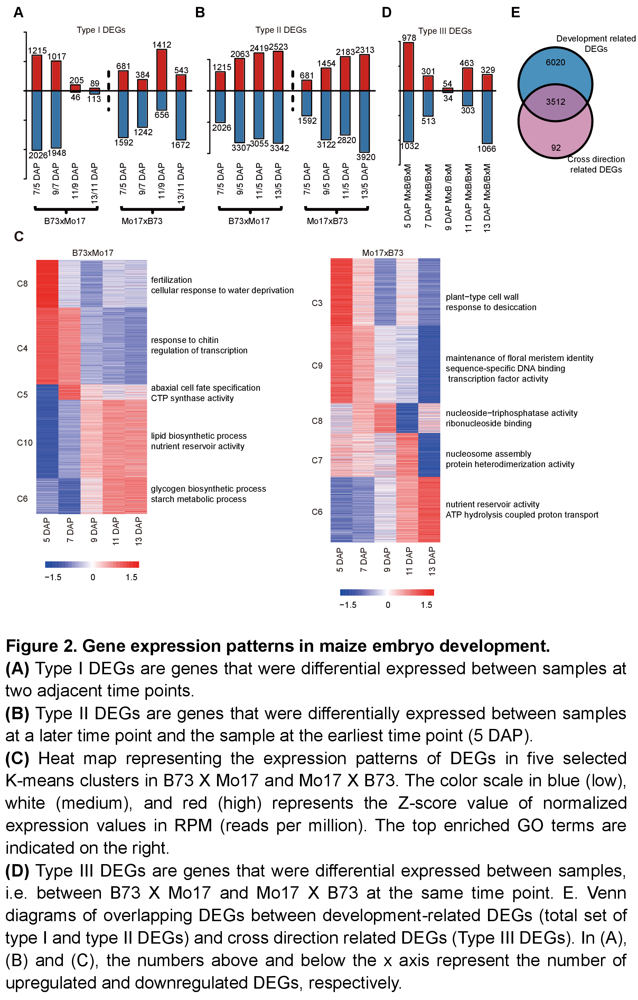

In [16]:
display.Image("notebook_material/PP2017-RA-00522_Figure_2.jpg",width=700,height=700)

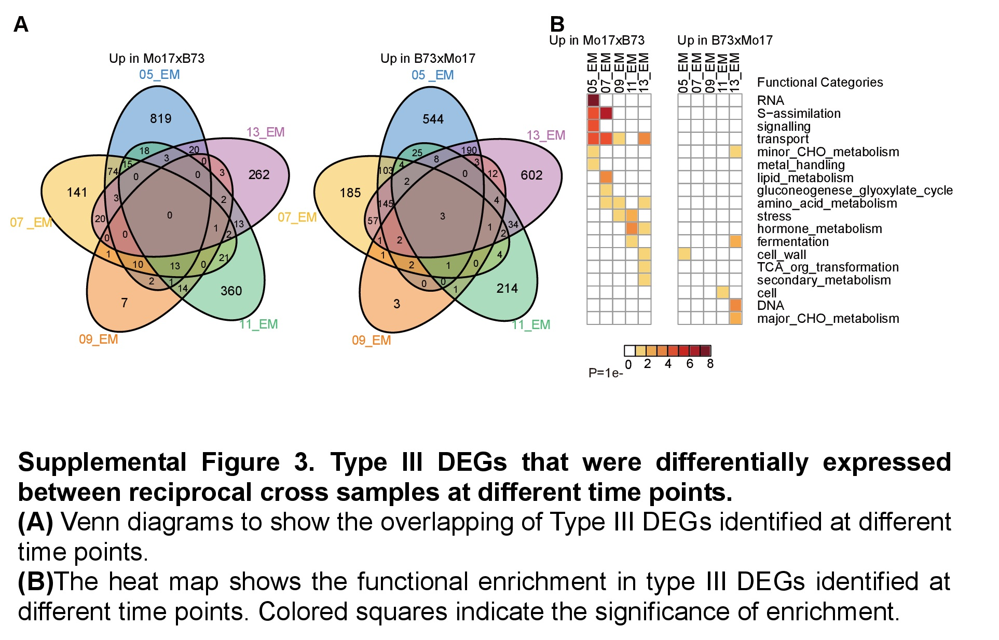

In [17]:
display.Image("notebook_material/PP2017-RA-supp-3.jpg",width=700,height=700)

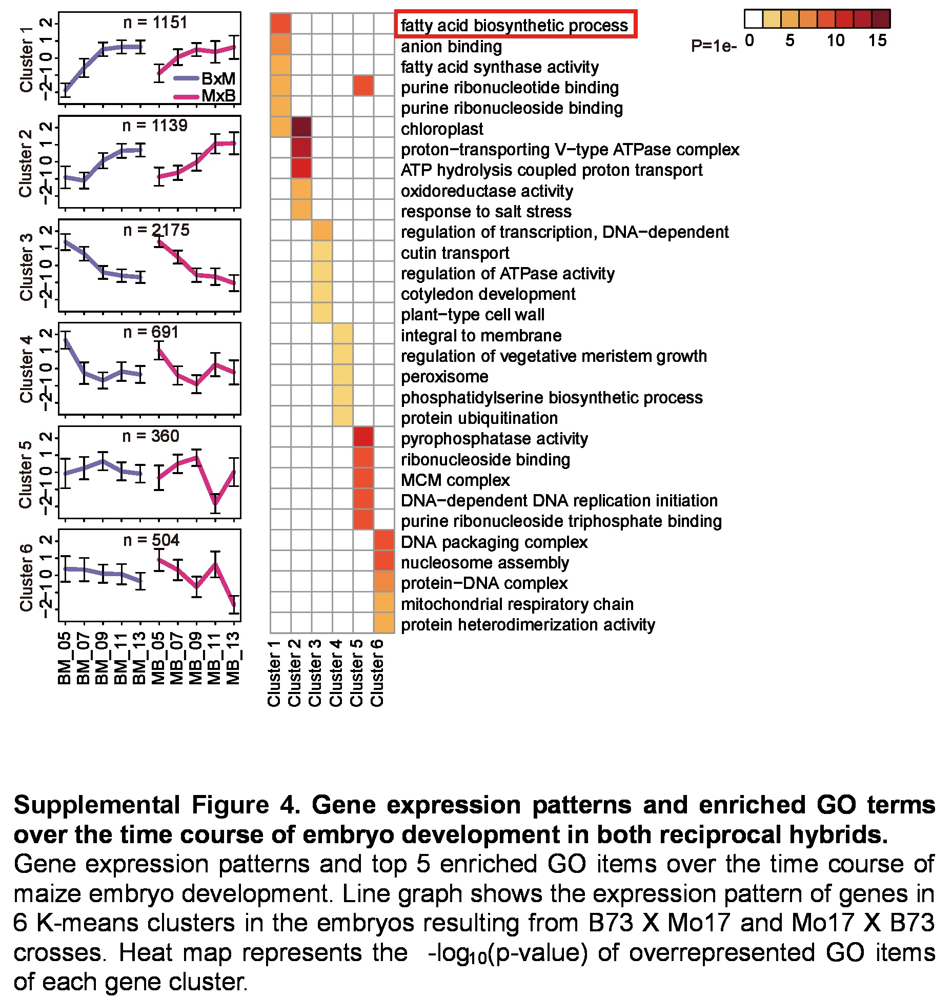

In [22]:
display.Image("notebook_material/PP2017-RA-supp-4.jpg",width=700,height=700)

### 5. Identification of imprinting genes

**Method**: Genes which had more than 10 allelic reads for each direction of the cross were used to perform (χ2) (chisq) test. (Relative to an expected 1 maternal: 1 paternal ratio in embryo. Relative to an expected 2 maternal: 1 paternal ratio in endosperm). Moderate MEGs/PEGs were defined as follows: In embryo, as having significant allelic bias (χ2 < 0.05) and >75% of transcripts from the maternal/paternal allele in both directions of a reciprocal cross. In endosperm, as having significant allelic bias (χ2 < 0.05) and >80% of transcripts from the maternal allele for MEGs or >60% of the transcripts from the paternal allele for PEGs. Strong MEGs/PEGs were defined as having significant allelic bias (χ2 < 0.01) and >90% of transcripts from the maternal/paternal allele. Complete MEGs/PEGs have >99% of the transcripts derived from the maternal/paternal allele (11). Genes which were identified as imprinted genes were supported by at least two biological replicates.

**script** :

`bash $BIN/Imprinting_gene_features.bash
bash $BIN/Table_make.bash
bash $BIN/circoslize.bash
Rscript $SRC/ase_density_sca.R
Rscript $SRC/ase_density_sca.R
Rscript $SRC/maternal_paternal_fpkm_and_imprinting_pattern_em-ed_05.R
`


**Mapping bias:** We mapped the clean reads to B73 reference and Mo17-mimic reference. Howerver, a little mapping bias still exists

`Rscript $SRC/maternal_paternal_fpkm_and_imprinting_plot_smoothScatter.R` ## for smoothplot

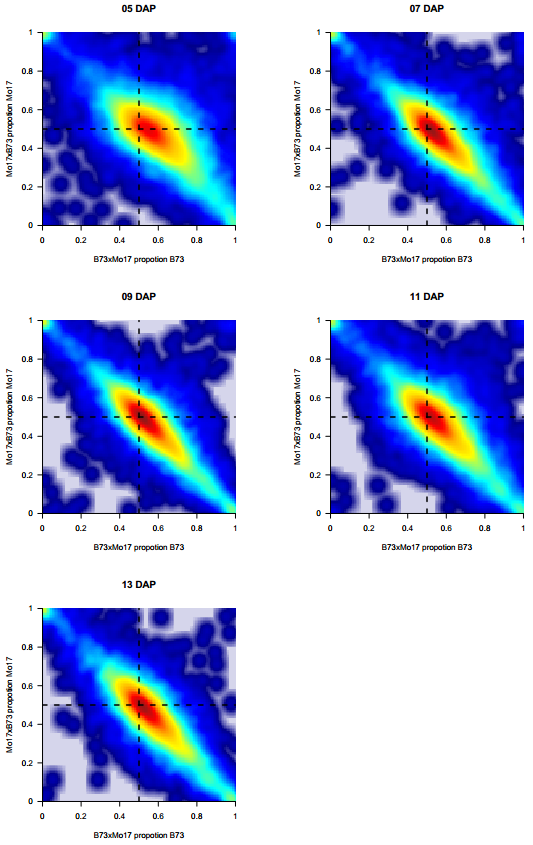

In [23]:
display.Image("notebook_material/Mapping_bias.png",height=700,width=500)

**Legend** Relative density of parental transcript proportion in both reciprocal hybrids is plotted for 13,063 genes that had at least 10 allelic reads and 7 DAP embryos resulting from both reciprocal crosses. 12636, 13012, and 12367 genes plotted in 9 DAP, 11 DAP, and 13 DAP embryos, respectively. The color scale in white(low), green (medium), and red (high) represents the relative density. 05_EM means samples in 5 DAP embryo, 07_EM means samples in 7 DAP embryo, 09_EM means samples in 9 DAP embryo, 11_EM means samples in 11 DAP embryo, 13_EM means samples in 13DAP embryo.

**Chromosal location of imprinted genes**

`bash $BIN/circoslize.bash` ## for circus plot 


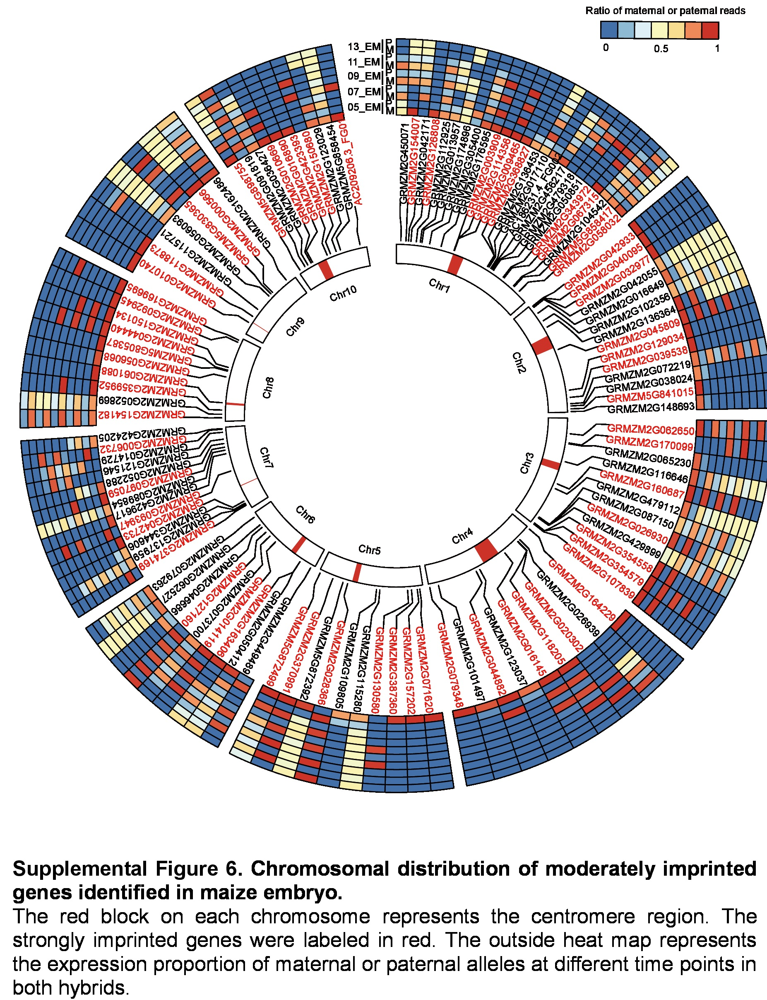

In [29]:
display.Image("notebook_material/PP2017-RA-supp-6.jpg",width=600,height=600)

**Discovery of imprinted genes in maize embryo and endosperm**

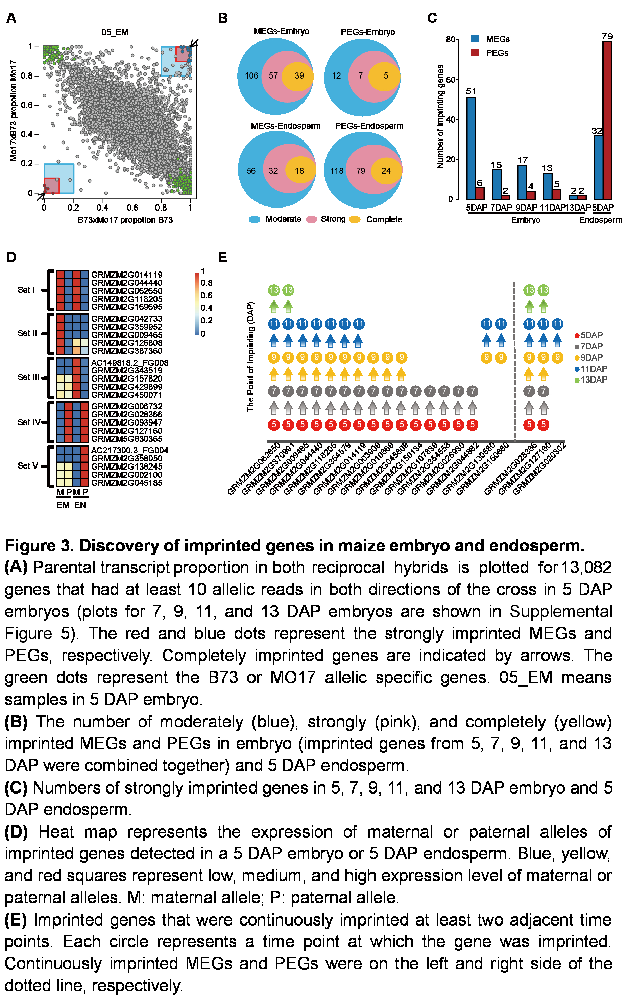

In [30]:
display.Image("notebook_material/PP2017-RA-00522_Figure_3.jpg",height=700,width=500)

**Imprinted genes in 7, 9, 11,13 DAP samples and LCM 3DAP, 5DAP samples**

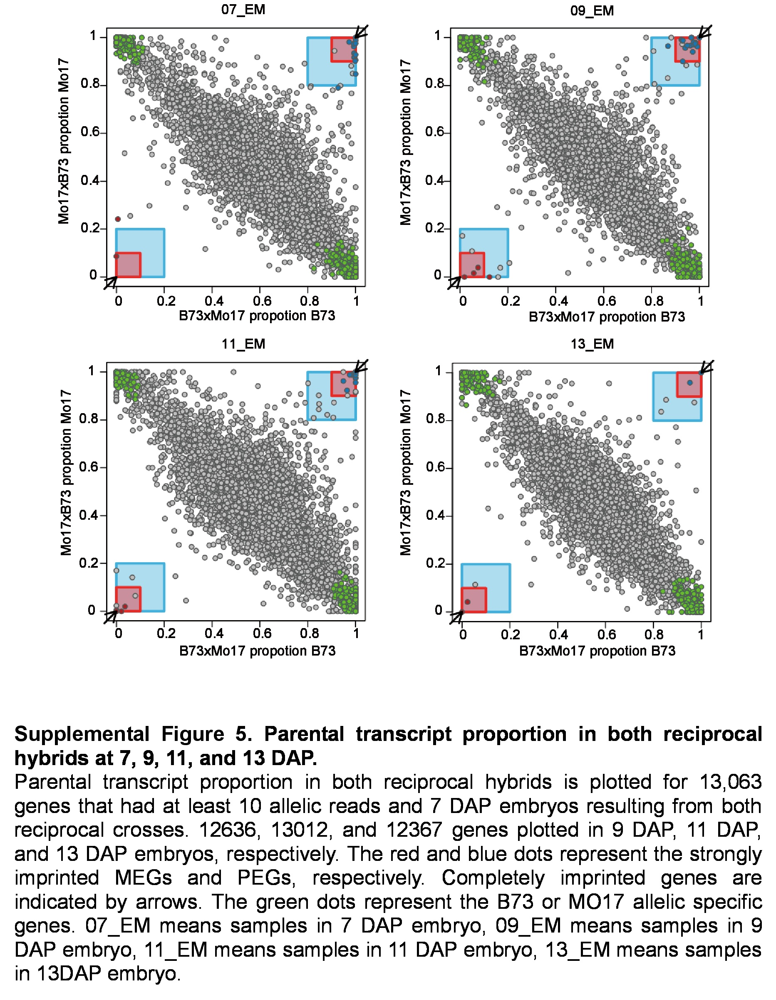

In [27]:
display.Image('notebook_material/PP2017-RA-supp-5.jpg',width=500,height=500)

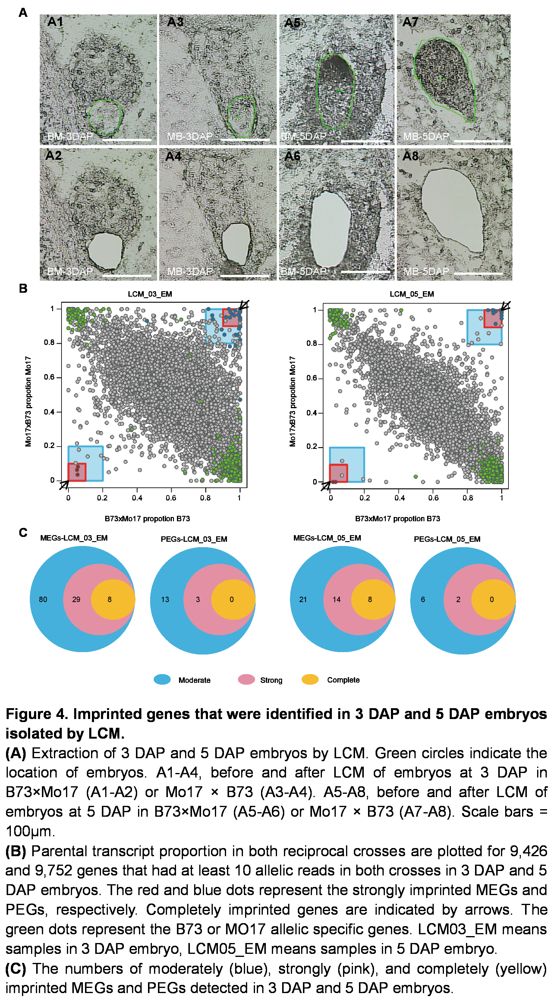

In [26]:
display.Image('notebook_material/PP2017-RA-00522_Figure_4.jpg',width=500,height=500)

###  7.Estimation of maternal contamination

### 8.Identification of lncRNA 

`bash $BIN/lincRNA_analysis.bash`

`bash $BIN/lincRNA_analysis_expression.bash` ## None imprinted lncRNAs

[LncRNA identification pipelne](https://genomebiology.biomedcentral.com/articles/10.1186/gb-2014-15-2-r40)
